In [57]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import sys

In [58]:
from IPython.display import Image, display

def imshow(img, ax=None):
	if ax is None:
		ret, encoded = cv2.imencode(".jpg", img)
		display(Image(encoded))
	else:
		ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
		ax.axis('off')

### Part 1a. Edge detection using Canny edge detector

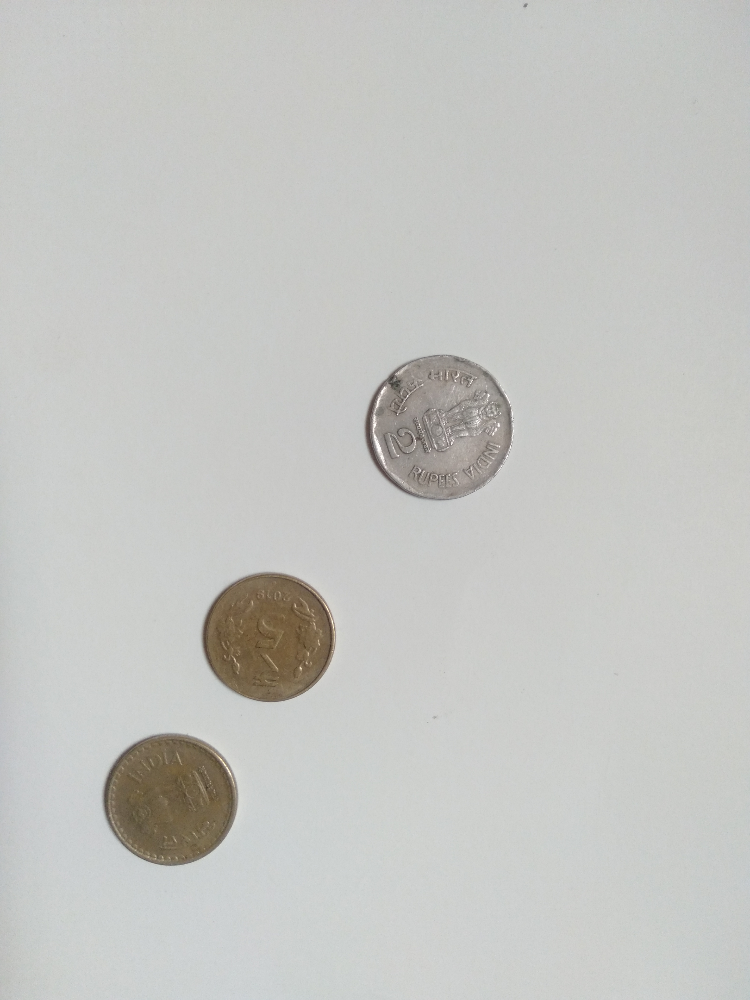

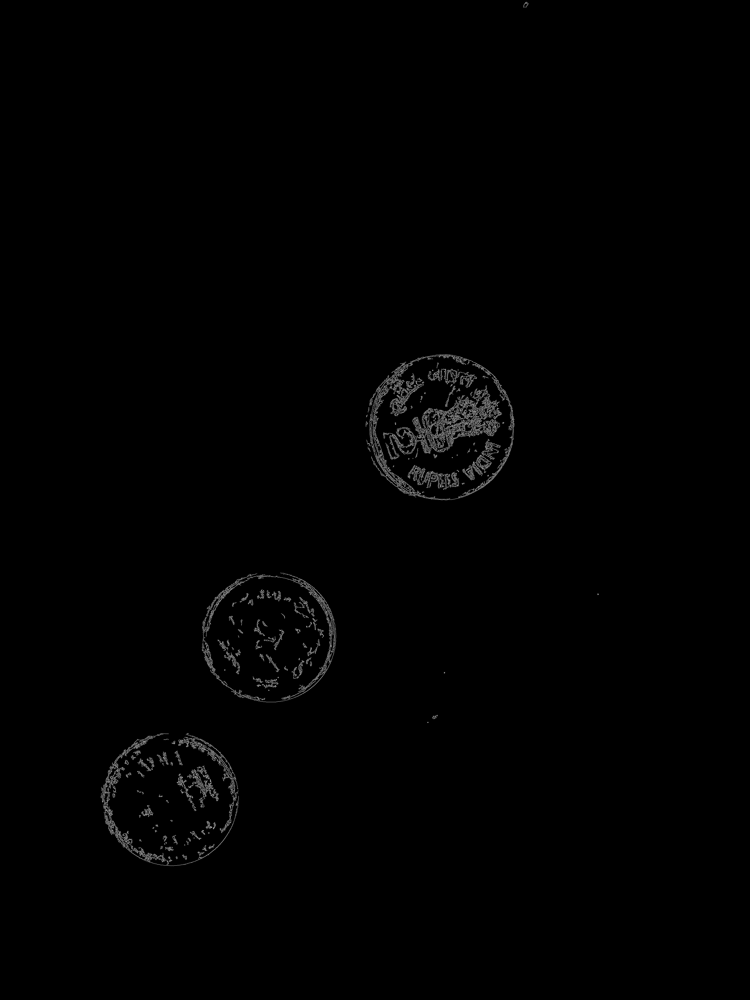

In [59]:
img = cv2.imread("three.jpg") # Read image 

# Setting parameter values 
t_lower = 30 # Lower Threshold 
t_upper = 150 # Upper threshold 

# Applying the Canny Edge filter 
edge = cv2.Canny(img, t_lower, t_upper) 

imshow(img)
imshow(edge)
#cv2.imshow('original', img) 
#cv2.imshow('edge', edge) 
#cv2.waitKey(0) 
#cv2.destroyAllWindows() 

### Part 1b. Region-based segmentation

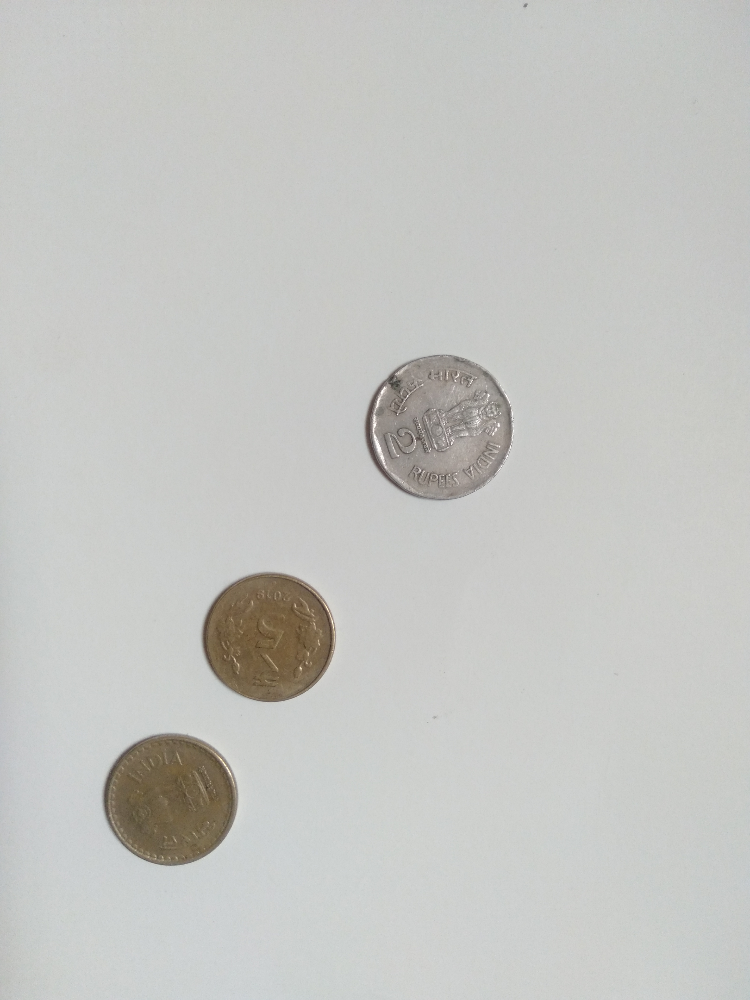

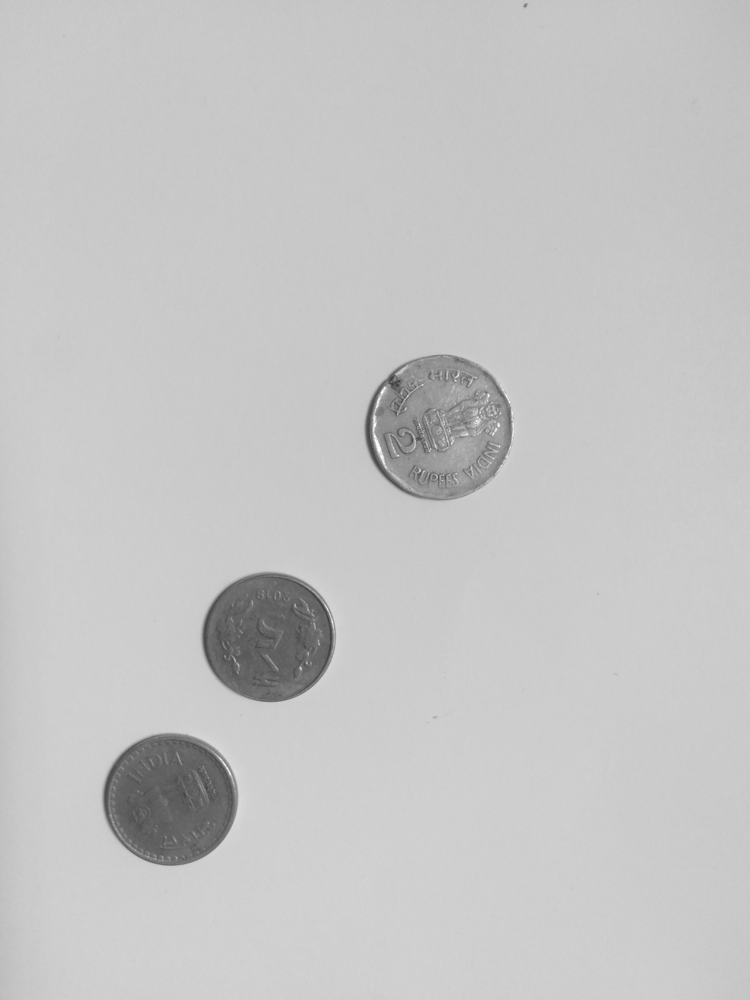

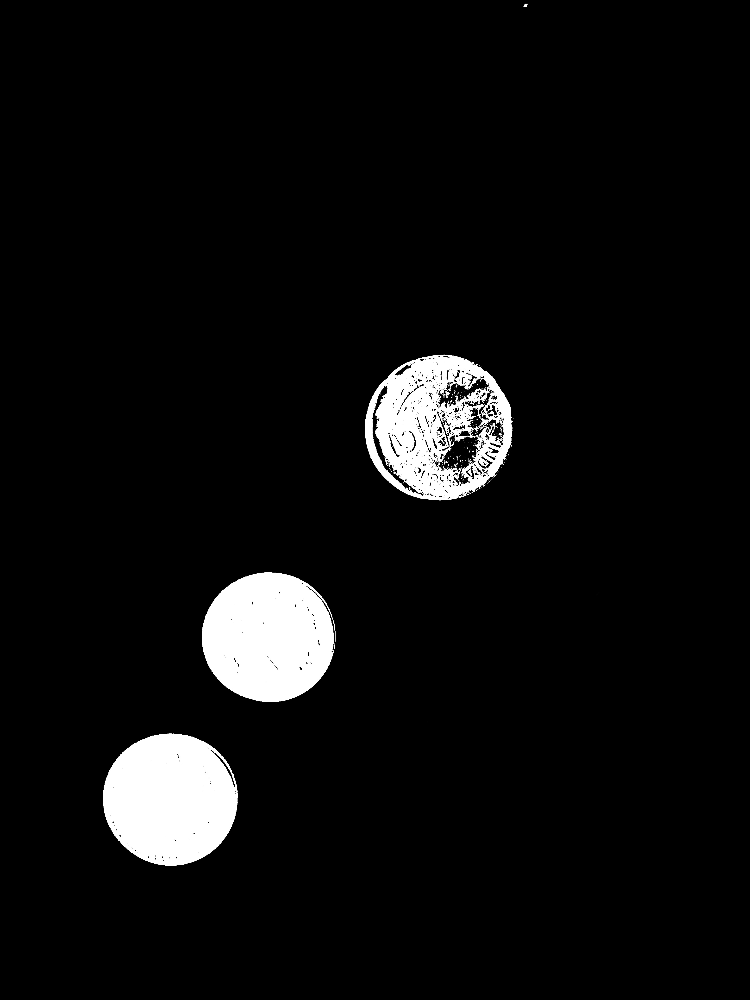

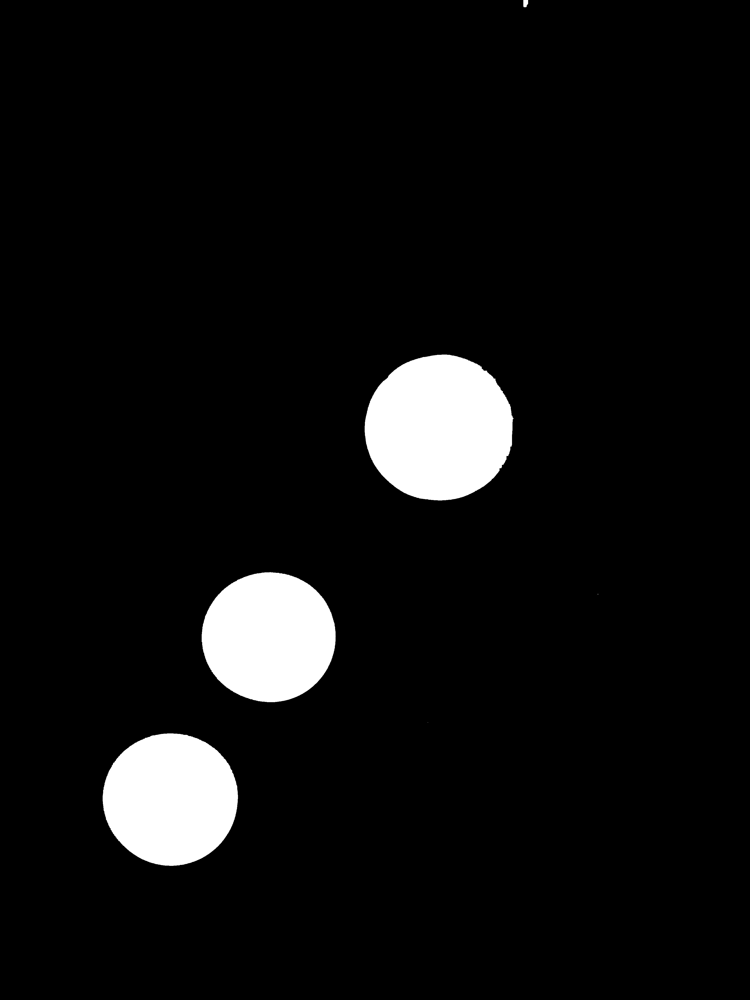

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..297.83087].


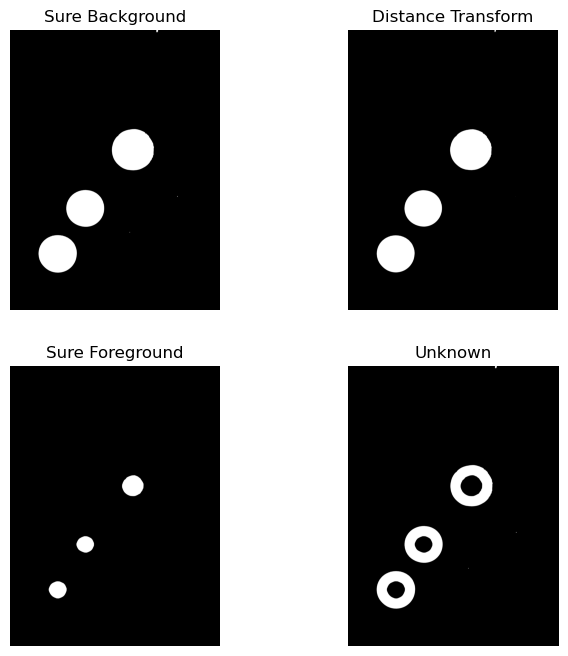

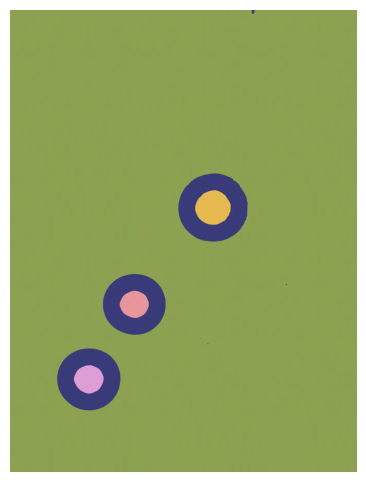

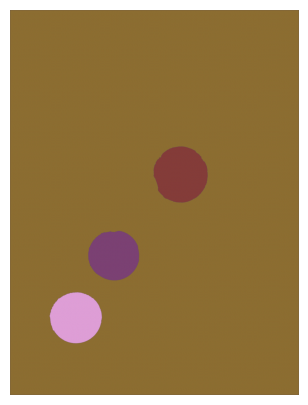

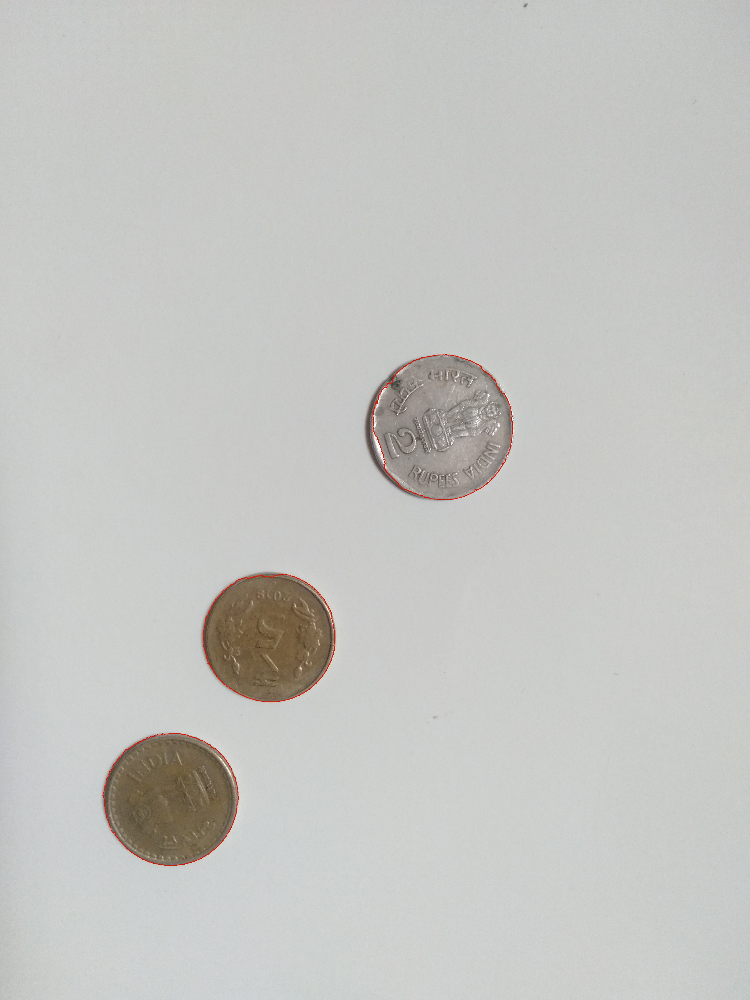

In [60]:
from IPython.display import Image, display

# Image loading
image_src = cv2.imread("three.jpg")
# Show image
imshow(image_src)

# Image grayscale conversion
grayscale = cv2.cvtColor(image_src, cv2.COLOR_BGR2GRAY)
imshow(grayscale)

# Threshold Processing
return_val, binary_image = cv2.threshold(grayscale,
                           0, 255, 
                           cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
imshow(binary_image)

# Noise removal
structuring_element = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
binary_image = cv2.morphologyEx(binary_image, 
                      cv2.MORPH_CLOSE,
                      structuring_element,
                      iterations=27)
imshow(binary_image)

# Create subplots with 1 row and 2 columns
figure, plot_axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
# Sure background area
background_region = cv2.dilate(binary_image, structuring_element, iterations=3)
imshow(background_region, plot_axes[0,0])
plot_axes[0, 0].set_title('Sure Background')

# Distance transform
distance_map = cv2.distanceTransform(binary_image, cv2.DIST_L2, 5)
imshow(distance_map, plot_axes[0,1])
plot_axes[0, 1].set_title('Distance Transform')

# Foreground area
return_val, foreground_region = cv2.threshold(distance_map, 0.5 * distance_map.max(), 255, cv2.THRESH_BINARY)
foreground_region = foreground_region.astype(np.uint8) 
imshow(foreground_region, plot_axes[1,0])
plot_axes[1, 0].set_title('Sure Foreground')

# Unknown area
uncertain_region = cv2.subtract(background_region, foreground_region)
imshow(uncertain_region, plot_axes[1,1])
plot_axes[1, 1].set_title('Unknown')

plt.show()

# Marker labelling
# Sure foreground 
return_val, marker_labels = cv2.connectedComponents(foreground_region)

# Add one to all labels so that background is not 0, but 1
marker_labels += 1
# Mark the region of unknown with zero
marker_labels[uncertain_region == 255] = 0

figure, single_axis = plt.subplots(figsize=(6, 6))
single_axis.imshow(marker_labels, cmap="tab20b")
single_axis.axis('off')
plt.show()

# Watershed Algorithm
watershed_result = cv2.watershed(image_src, marker_labels)

figure, single_axis = plt.subplots(figsize=(5, 5))
single_axis.imshow(watershed_result, cmap="tab20b")
single_axis.axis('off')
plt.show()

unique_labels = np.unique(watershed_result)

coin_contours = []
for current_label in unique_labels[2:]: 

    # Create a binary image in which only the area of the label is in the foreground 
    # and the rest of the image is in the background 
    region_mask = np.where(watershed_result == current_label, 255, 0).astype(np.uint8)

    # Perform contour extraction on the created binary image
    extracted_contours, contour_hierarchy = cv2.findContours(
        region_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    coin_contours.append(extracted_contours[0])

# Draw the outline
image_src = cv2.drawContours(image_src, coin_contours, -1, color=(0, 23, 223), thickness=2)
imshow(image_src)

### Part1c. Coin counting

Number of coins is 3


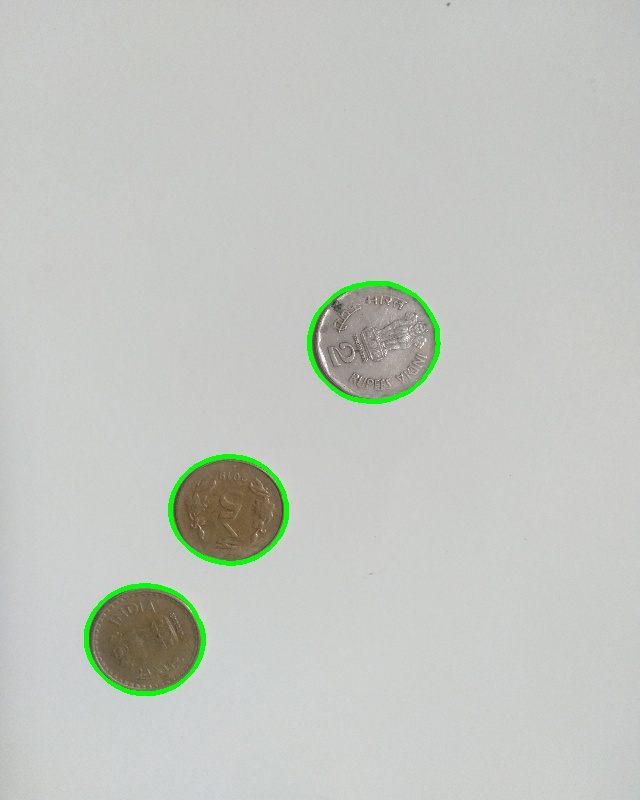

In [61]:
# Load and preprocess the image
source_image = cv2.imread("three.jpg")
resized_image = cv2.resize(source_image, (640, 800))
result_image = resized_image.copy()
blurred_image = cv2.GaussianBlur(resized_image, (7, 7), 3)

# Convert to grayscale and apply thresholding
grayscale = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)
threshold_value, binary_image = cv2.threshold(grayscale, 170, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
detected_contours, _ = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Calculate area for each contour
contour_areas = {}
for contour_index in range(len(detected_contours)):
    current_contour = detected_contours[contour_index]
    contour_size = cv2.contourArea(current_contour)
    contour_areas[contour_index] = contour_size

# Sort contours by area (largest first)
sorted_contours = sorted(contour_areas.items(), key=lambda x: x[1], reverse=True)
contour_data = np.array(sorted_contours).astype("int")

# Count contours with area greater than 500
valid_contour_count = np.argwhere(contour_data[:, 1] > 500).shape[0]

# Draw contours on the image (skip the largest one, which is likely the background)
for index in range(1, valid_contour_count):
    contour_id = contour_data[index, 0]
    result_image = cv2.drawContours(result_image, detected_contours, contour_id,
                                  (0, 255, 0), 3)

# Display results
coin_count = valid_contour_count - 1
print("Number of coins is", coin_count)

imshow(result_image)
#cv2.waitKey(0)  # Wait until a key is pressed
#cv2.destroyAllWindows()  # Close all OpenCV windows

# from matplotlib import pyplot as plt
# plt.figure(figsize=(10, 8))
# plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
# plt.title(f"Number of coins: {coin_count}")
# plt.axis('off')
# plt.show()